# Downloading Libraries


In [139]:
!pip install plotly 

^C


In [140]:
!pip install plotly_express

In [ ]:
!pip install pandas==0.22

# Importing Libraries

In [183]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lasio
import glob
import os
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# Collecting Paths

In [2]:
paths = glob.glob(os.path.join("C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA","*.las"))
paths

['C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\1-SAWAN-08.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\2-SAWAN-01.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\3-SAWAN-02.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\4-SAWAN-07.las']

# Uploading Wells


In [3]:
wells=[]
for i in paths:
  well = lasio.read(i)
  well = well.df().reset_index()
  wells.append(well)

In [4]:
wells[2].columns

Index(['DEPT', 'BS', 'C1', 'C2', 'CALI', 'CALS', 'CGR', 'DRHO', 'DT', 'GR',
       'LLD', 'LLS', 'MSFL', 'NPHI', 'PEF', 'POTA', 'RHOB', 'SGR', 'SP',
       'THOR', 'TPRA', 'TURA', 'UPRA', 'URAN'],
      dtype='object')

# Changing Column names


In [5]:
wells[3]=wells[3].rename(columns={wells[3].columns[35]:"RHOB"})
wells[3]=wells[3].rename(columns={wells[3].columns[44]:"URAN"})
wells[0]=wells[0].rename(columns={wells[0].columns[1]:"BS"})
wells[1]["BS"]=8.7
wells[3]=wells[3].rename(columns={wells[3].columns[26]:"MSFL"})

# Cleaning Data


In [6]:
def data(wells):
  global data
  data=[]
  desired=["DEPT","CALI","GR","THOR","POTA","LLD","LLS","NPHI","RHOB","CGR","SGR","BS","URAN","MSFL","PEF","SP"]
  for i in wells:
    well = i.loc[:,desired]
    well.loc[:,"NPHI"] = well.loc[:,"NPHI"]*100
    well["LLS_o"]=well.loc[:,"LLS"]
    well.loc[:,"LLS"] = np.log10(well.loc[:,"LLS"])
    well.loc[:,"LLD"] = np.log10(well.loc[:,"LLD"])
    well.loc[:,"MSFL"] = np.log10(well.loc[:,"MSFL"])
    
    well = well.dropna(how="any").reset_index(drop=True)
    data.append(well)

In [7]:
data(wells)

E:\anaconda\lib\site-packages\pandas\core\series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [8]:
wells_name=["SAWAN-8","SAWAN-1","SAWAN-2","SAWAN-7"]

#### Caliper Log


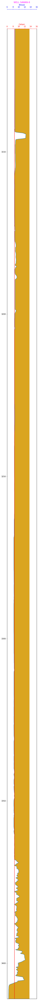

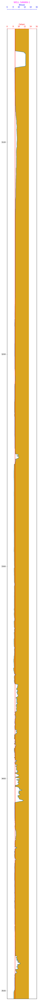

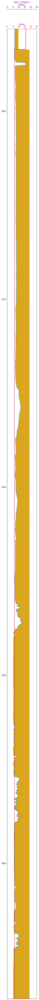

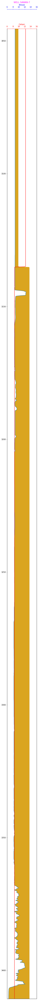

In [9]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax2 = ax1.twiny()
  ax1.plot("CALI","DEPT",data=data[i])
  ax1.set_xlim(6, 16)
  ax1.set_xlabel('Caliper')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax2.plot("BS","DEPT",data=data[i],color="red")
  ax2.set_xlim(6, 16)
  ax2.set_xlabel('Bitsize')
  ax2.xaxis.label.set_color("blue")
  ax2.spines["top"].set_position(("axes", 1.02))
  ax2.tick_params(axis='x', colors="blue")
  ax2.spines["top"].set_edgecolor("blue")
  x1=data[i]['CALI']
  x2=data[i]['BS']
  x = np.array(ax1.get_xlim())
  z = np.array(ax2.get_xlim())
  nz=((x2-np.max(z))/(np.min(z)-np.max(z)))*(np.max(x)-np.min(x))+np.min(x)
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1<=nz, interpolate=True, color='goldenrod')
  ax1.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1>=nz, interpolate=True, color='yellow')
  for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Gamma ray log

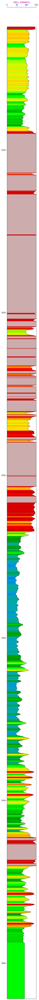

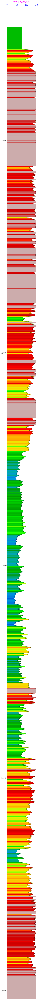

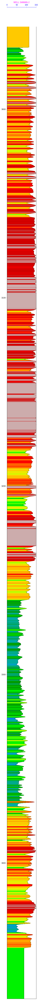

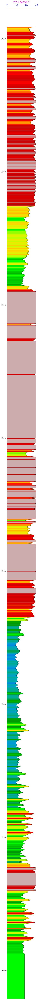

In [10]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  left_col_value = 0
  right_col_value = 150
  curve = data[i]['GR']
  span = abs(left_col_value - right_col_value)
  cmap = plt.get_cmap('nipy_spectral')
  color_index = np.arange(left_col_value, right_col_value, span / 100)
  
  ax.plot('GR','DEPT', c='black', lw=0.5,data=data[i])
  ax.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax.set_xlim(0, 150)
  ax.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax.xaxis.set_ticks_position("top")
  ax.xaxis.set_label_position("top")
  ax.xaxis.label.set_color("blue")
  ax.yaxis.label.set_color("green")
  ax.spines["top"].set_position(("axes", 1.02))
  ax.tick_params(axis='x', colors="blue")
  ax.spines["top"].set_edgecolor("blue")
  for index in sorted(color_index):
    index_value = (index - left_col_value)/span
    color = cmap(index_value) #obtain colour for color index value
    plt.fill_betweenx(data[i]['DEPT'], 0 , curve, where = curve >= index,  color = color)
  plt.show()

#### Resistivity Log 

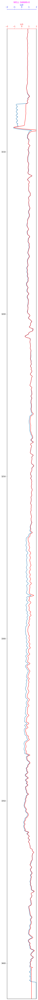

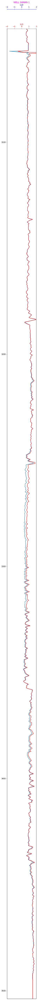

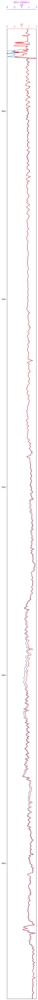

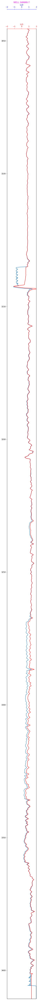

In [11]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax2 = ax1.twiny()
  ax1.plot("LLS","DEPT",data=data[i])
  ax1.set_xlabel('LLS')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax2.plot("LLD","DEPT",data=data[i],color="red")
  ax2.set_xlabel('LLD')
  ax1.set_xlim(-2, 2)
  ax2.set_xlim(-2, 2)
  ax2.xaxis.label.set_color("blue")
  ax2.spines["top"].set_position(("axes", 1.02))
  ax2.tick_params(axis='x', colors="blue")
  ax2.spines["top"].set_edgecolor("blue")
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")


#### Self Spontaneous Log

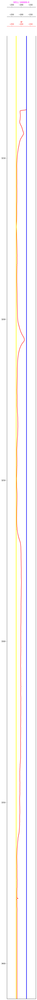

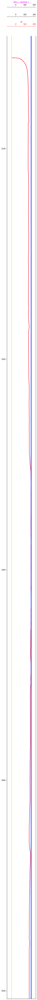

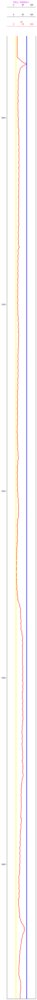

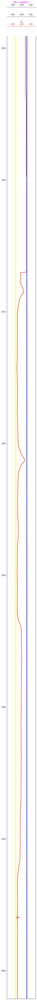

In [12]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax1.plot('SP', 'DEPT', data=data[i], color='red', lw=2)
  ax2 = ax1.twiny()
  ax3 = ax1.twiny()
  ax1.set_xlabel('SP')
  ax1.set_xlim(data[i]["SP"].min()-50,data[i]["SP"].max()+50)
 
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.spines["top"].set_position(("axes", 1.01))
  ax2.plot(np.ones(len(data[i]["SP"]))*max(data[i]["SP"]),data[i]["DEPT"],color="blue",lw=3)
  ax2.spines["top"].set_position(("axes", 1.02))  
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax2.set_xlim(data[i]["SP"].min()-50,data[i]["SP"].max()+50)
  
  ax3.plot(np.ones(len(data[i]["SP"]))*min(data[i]["SP"]),data[i]["DEPT"],color="yellow",lw=3)
  ax3.spines["top"].set_position(("axes", 1.03)) 
 
  ax3.set_xlim(data[i]["SP"].min()-50,data[i]["SP"].max()+50)
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax3.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1]:
        ax.xaxis.set_ticks_position("top")
        ax.xaxis.set_label_position("top")

# Neutron Porosity

In [275]:
!git clone https://github.com/yohanesnuwara/formation-evaluation

Cloning into 'formation-evaluation'...
Updating files:  92% (23/25)
Updating files:  96% (24/25)
Updating files: 100% (25/25)
Updating files: 100% (25/25), done.


In [278]:
def ND_plot(denfl, df, column_nphi, column_rhob, column_hue, color_by,
            figsize=(7,7), scatter_size=50, scatter_alpha=0.5):  
    plt.style.use('seaborn')
    sns.set_theme(color_codes=True)
    lsX = np.arange(0, 0.55, 0.05)
    ssSNP = 0.222*lsX**2 + 1.021*lsX + 0.024
    dolSNP = 0.6*lsX**2 + 0.749*lsX - 0.00434
    ssCNL = 0.222*lsX**2 + 1.021*lsX + 0.039
    dolCNL = 1.40*lsX**2 + 0.389*lsX - 0.01259
    ssSnpX = np.empty((np.size(lsX),0), float)
    dolSnpX = np.empty((np.size(lsX),0), float)
    ssCnlX = np.empty((np.size(lsX),0), float)
    dolCnlX = np.empty((np.size(lsX),0), float)
    for i in np.nditer(lsX):
        ssSnpX = np.append(ssSnpX, np.roots([0.222, 1.021, 0.024 - i])[1])
        dolSnpX = np.append(dolSnpX, np.roots([0.6, 0.749, -0.00434 - i])[1])
        ssCnlX = np.append(ssCnlX, np.roots([0.222, 1.021, 0.039 - i])[1])
        dolCnlX = np.append(dolCnlX, np.roots([1.40, 0.389, -0.01259 - i])[1])
    densma_Ls = 2.71; densma_Ss = 2.65; densma_Dol = 2.87 #densma: density matrix
    denLs = (denfl - densma_Ls) * lsX + densma_Ls
    denSs = (denfl - densma_Ss) * lsX + densma_Ss
    denDol = (denfl - densma_Dol) * lsX + densma_Dol
    if color_by == 'continuous':
        plt.figure(figsize=figsize)
        plt.scatter(df[column_nphi], df[column_rhob], c=df[column_hue],
                alpha=scatter_alpha, cmap='viridis')
        plt.colorbar()
        plt.plot(ssCnlX, denSs, '.-', color='blue', markersize=10, label = 'Sandstone')
        plt.plot(lsX, denLs, '.-', color='black', markersize=10, label = 'Limestone')
        plt.plot(dolCnlX, denDol, '.-', color='red', markersize=10, label = 'Dolomite')
        plt.title('Neutron-Density Plot', size=20, pad=15)
        plt.xlim(-0.05, 0.45)
        plt.ylim(3, 1.9)
        plt.xlabel('NPHI (v/v)'); plt.ylabel('RHOB (g/cc)')  
        plt.show()

    # plot the sand, limestone, and dolomite line (using Seaborn)
      



In [280]:
DATA = data[0]
DATA["NPHI"]=DATA["NPHI"]/100

<ipython-input-280-74e4bda0da15>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



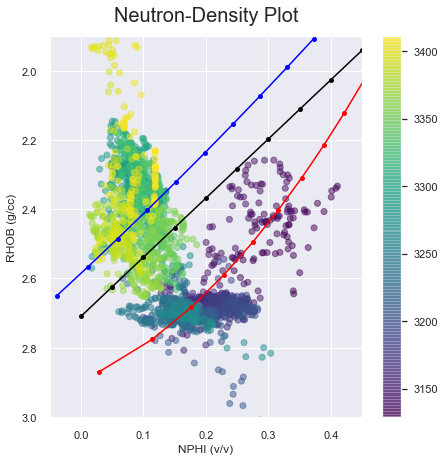

In [282]:
ND_plot(1, data[0], "NPHI", "RHOB", "DEPT", color_by="continuous",figsize=(7,7))

#### CrossOver 

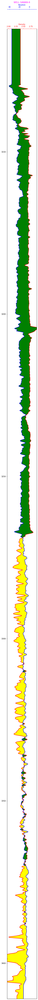

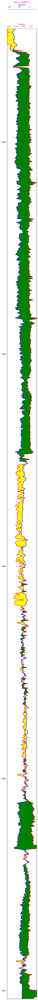

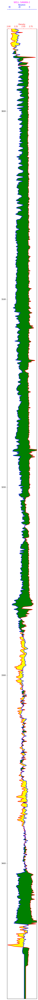

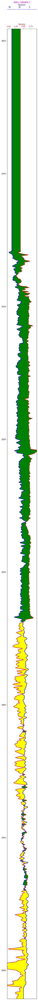

In [13]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax2 = ax1.twiny()
  
  ax1.plot('RHOB', 'DEPT', data=data[i], color='red', lw=2)
  ax1.set_xlim(1.95, 2.95)
  ax1.set_xlabel('Density')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")

  ax2.plot('NPHI', 'DEPT', data=data[i], color='blue', lw=2)
  ax2.set_xlim(45, -15)
  ax2.set_xlabel('Neutron')
  ax2.xaxis.label.set_color("blue")
  ax2.spines["top"].set_position(("axes", 1.02))
  ax2.tick_params(axis='x', colors="blue")
  ax2.spines["top"].set_edgecolor("blue")
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  x1=data[i]['RHOB']
  x2=data[i]['NPHI']
  x = np.array(ax1.get_xlim())
  z = np.array(ax2.get_xlim())
  nz=((x2-np.max(z))/(np.min(z)-np.max(z)))*(np.max(x)-np.min(x))+np.min(x)
  ax1.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1>=nz, interpolate=True, color='green')
  ax1.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1<=nz, interpolate=True, color='yellow')
  for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Average Porosity

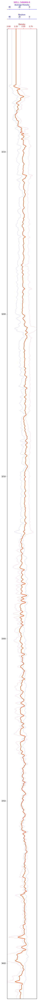

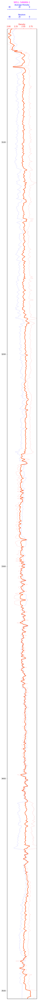

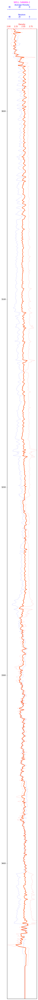

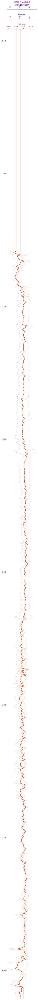

In [14]:

for i in range(len(data)):
  data[i]["Density Porosity"] = ((data[i]["RHOB"] - 2.71)/(1-2.71))*100
  data[i]["Average Porosity"] = (data[i]["Density Porosity"] + data[i]["NPHI"])/2
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax2 = ax1.twiny()
  ax3 = ax1.twiny()
  ax1.plot('RHOB', 'DEPT', data=data[i], color='red', lw=0.2)
  ax1.set_xlim(1.95, 2.95)
  ax1.set_xlabel('Density')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")

  ax2.plot('NPHI', 'DEPT', data=data[i], color='blue', lw=0.2)
  ax2.set_xlim(45, -15)
  ax2.set_xlabel('Neutron')
  ax2.xaxis.label.set_color("blue")
  ax2.spines["top"].set_position(("axes", 1.01))
  ax2.tick_params(axis='x', colors="blue")
  ax2.spines["top"].set_edgecolor("blue")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")

  ax3.plot('Average Porosity', 'DEPT', data=data[i], color='orangered', lw=2)
  ax3.set_xlim(45, -15)
  ax3.set_xlabel('Average Porosity')
  ax3.xaxis.label.set_color("blue")
  ax3.spines["top"].set_position(("axes", 1.02))
  ax3.tick_params(axis='x', colors="blue")
  ax3.spines["top"].set_edgecolor("blue")
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax3.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### CGR and SGR

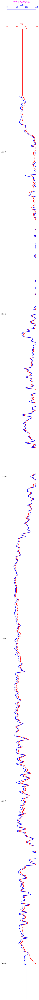

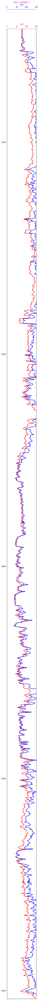

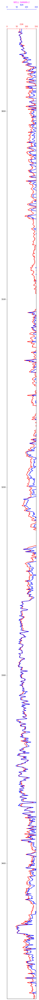

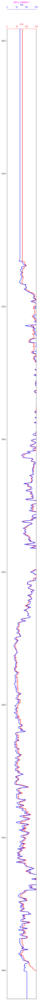

In [15]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax2 = ax1.twiny()
  
  ax1.plot('CGR', 'DEPT', data=data[i], color='red', lw=2)
  ax1.set_xlim(0, 150)
  ax1.set_xlabel('CGR')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")

  ax2.plot('SGR', 'DEPT', data=data[i], color='blue', lw=2)
  ax2.set_xlim(0, 150)
  ax2.set_xlabel('SGR')
  ax2.xaxis.label.set_color("blue")
  ax2.spines["top"].set_position(("axes", 1.02))
  ax2.tick_params(axis='x', colors="blue")
  ax2.spines["top"].set_edgecolor("blue")
  ax2.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Potassium 

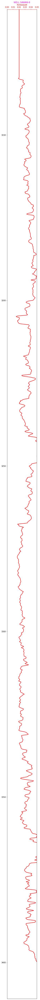

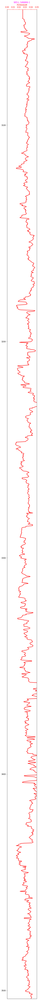

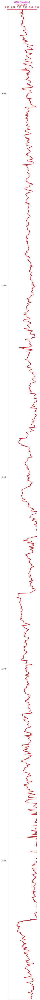

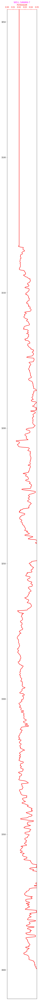

In [16]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)

  
  ax1.plot('POTA', 'DEPT', data=data[i], color='red', lw=2)
  ax1.set_xlim(0, 0.05)
  ax1.set_xlabel('POTASSIUM')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Thorium 

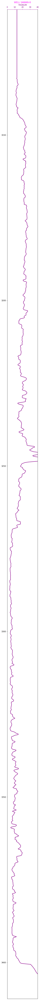

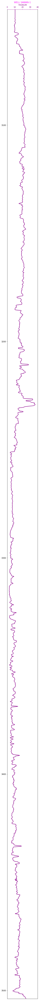

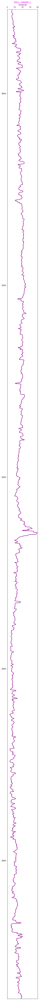

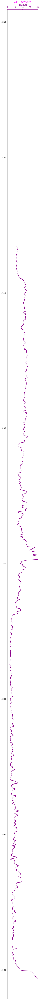

In [17]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)

  
  ax1.plot('THOR', 'DEPT', data=data[i], color="darkmagenta", lw=2)
  ax1.set_xlim(0, 40)
  ax1.set_xlabel('THORIUM')
  ax1.xaxis.label.set_color("darkmagenta")
  ax1.tick_params(axis='x', colors="darkmagenta")
  ax1.spines["top"].set_edgecolor("darkmagenta")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Uranium


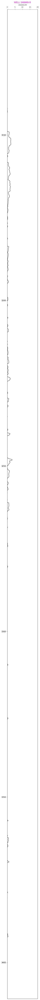

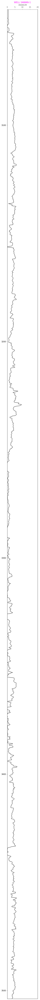

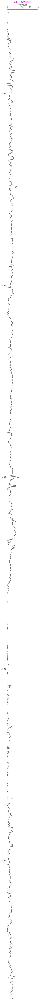

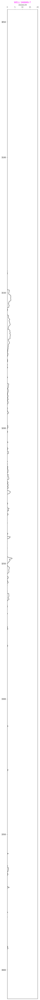

In [18]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)

  
  ax1.plot('URAN', 'DEPT', data=data[i], color="dimgrey", lw=2)
  ax1.set_xlim(0, 20)
  ax1.set_xlabel('URANIUM')
  ax1.xaxis.label.set_color("dimgrey")
  ax1.tick_params(axis='x', colors="dimgrey")
  ax1.spines["top"].set_edgecolor("dimgrey")
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  for ax in [ax1]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

#### Gamma Ray Trend

In [19]:
# for i in range(len(data)):
#   fig = plt.subplots(figsize=(3,700))
#   ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
#   ax2 = ax1.twiny()
#   ax3 = ax1.twiny()
#   ax1.set_xlim(150, 0)
#   ax1.set_xlabel('GR')
#   ax1.xaxis.label.set_color("white")
#   ax1.tick_params(axis='x', colors="white")
#   ax1.spines["top"].set_edgecolor("white")
#   ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
#   ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
#   ax2.scatter(75*np.ones((len(data[i]["DEPT"]))),data[i]["DEPT"],s=1)
#   ax2.set_xlim(150, 0)
#   x1=75*np.ones((len(data[i]["DEPT"])))
#   x2=data[i]["GR"]
#   x = np.array(ax1.get_xlim())
#   z = np.array(ax2.get_xlim())
#   nz=((x2-np.min(z))/(np.max(z)-np.min(z)))*(np.min(x)-np.max(x))+np.max(x)
#   ax2.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1>=nz, interpolate=True, color='black')
#   ax2.fill_betweenx(data[i]['DEPT'], x1, nz, where=x1<=nz, interpolate=True, color='yellow')
#   ax3.set_xlim(0,150)
#   ax1.get_xaxis().set_visible(False)
#   ax2.get_xaxis().set_visible(False)
#   ax1.set_yticks(np.arange(min(data[i]["DEPT"]),max(data[i]["DEPT"]),0.2))
#   ax1.set_yticks(data[i]["DEPT"])
#   ax1.tick_params(axis='y', colors="blue")
#   for ax in [ax1]:
#     ax.xaxis.set_ticks_position("top")
#     ax.xaxis.set_label_position("top")

# Non washout zones

In [20]:
sawan_well_1 = [3150,3368] 
sawan_well_2 = [3250,3350]
sawan_well_7 = [3270,3365]
sawan_well_8 = [3133,3355]

In [21]:
# data[0] = data[0][(data[0]["DEPT"]>sawan_well_8[0]) & (data[0]["DEPT"]<sawan_well_8[1])]
# data[1] = data[1][(data[1]["DEPT"]>sawan_well_1[0]) & (data[1]["DEPT"]<sawan_well_1[1])]


# Clay volume  Linear

In [22]:
for i in data:
    i["Clay Volume"] = ((i["GR"]-i["GR"].min())/(i["GR"].max()-i["GR"].min()))*100

In [23]:
# for i in data:
#     a = ((i["GR"]-i["GR"].min())/(i["GR"].max()-i["GR"].min()))
#     i["Clay Volume"] = (a/(3-(2*a)))

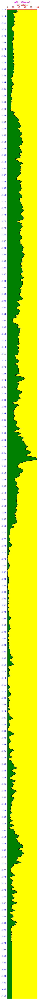

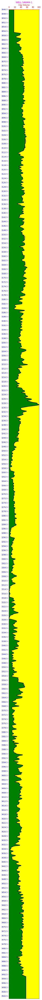

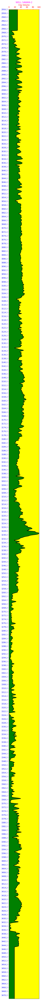

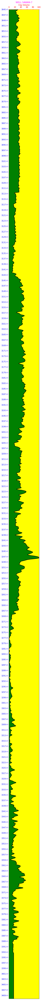

In [24]:
for i in range(len(data)):
  fig = plt.subplots(figsize=(3,100))
  ax1 = plt.subplot2grid((1,1), (0,0), rowspan=1, colspan=1)
  ax1.plot('Clay Volume', 'DEPT', data=data[i], color='black', lw=2)
  ax1.set_xlim(0, 100)
  ax1.set_xlabel('Clay Volume')
  ax1.xaxis.label.set_color("red")
  ax1.tick_params(axis='x', colors="red")
  ax1.spines["top"].set_edgecolor("red")
  ax1.set_yticks(np.arange(min(data[i]["DEPT"]),max(data[i]["DEPT"]),2))
  ax1.tick_params(axis='y', colors="blue")
  ax1.axis(ymin=max(data[i]["DEPT"]),ymax= min(data[i]["DEPT"]))
  ax1.set_title(f"WELL {wells_name[i]}").set_color("magenta")
  ax1.fill_betweenx(data[i]['DEPT'], data[i]['Clay Volume'], 0, facecolor='green')
  ax1.fill_betweenx(data[i]['DEPT'], data[i]['Clay Volume'], 100, facecolor='yellow')  

  
  for ax in [ax1]:
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")

### Clay Effect

In [25]:
for i in data:
    Porosity = i[i["Clay Volume"]==100.0]["Average Porosity"].values
    i["Clay Effect"] = (i["Clay Volume"]/100)*Porosity


In [26]:
# for i in data:
#     Porosity = i[i["Clay Volume"]==100.0]["Average Porosity"].values
#     i["Clay Effect"] = (i["Clay Volume"]/100)*Porosity

In [27]:
data[0]

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,BS,URAN,MSFL,PEF,SP,LLS_o,Density Porosity,Average Porosity,Clay Volume,Clay Effect
0,3112.0707,8.7006,142.9879,12.7700,0.0203,0.821906,0.816533,35.51,2.3998,79.1427,...,8.5,-1.5943,-1.045275,30.3433,-170.6250,6.5544,18.140351,26.825175,33.511970,2.364338
1,3112.1957,8.7006,144.5001,12.7700,0.0203,0.841410,0.835316,35.51,2.3998,79.1427,...,8.5,-1.5943,-1.045757,30.3433,-170.6250,6.8441,18.140351,26.825175,34.007236,2.399280
2,3112.3207,8.7006,143.0280,12.7700,0.0203,0.854701,0.848522,35.51,2.3998,79.1427,...,8.5,-1.5943,-1.045757,30.3433,-170.6250,7.0554,18.140351,26.825175,33.525103,2.365265
3,3112.4457,8.7006,142.6371,12.7700,0.0203,0.857971,0.852480,35.51,2.3998,79.1427,...,8.5,-1.5943,-1.045757,30.3433,-170.6250,7.1200,18.140351,26.825175,33.397078,2.356232
4,3112.5707,8.7006,143.3424,12.7700,0.0203,0.855780,0.850236,35.51,2.3998,79.1427,...,8.5,-1.5943,-1.045275,30.3433,-170.6250,7.0833,18.140351,26.825175,33.628074,2.372529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,3410.4457,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,8.5,-28.0069,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758
2388,3410.5707,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,8.5,-28.0069,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758
2389,3410.6957,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,8.5,-28.0069,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758
2390,3410.8207,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,8.5,-28.0069,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758


### Effective Porosity 

In [28]:
for i in data:
    i["Effective Porosity"] = i["Average Porosity"] - i["Clay Effect"]

### Sawan well : 1,2,7,8


In [29]:
paths_xlsx = glob.glob(os.path.join("C:/Users/Farooq Arshad/Desktop/Thesis wells/ZOOM GR/Depositional Environment","*xlsx"))
paths_xlsx

['C:/Users/Farooq Arshad/Desktop/Thesis wells/ZOOM GR/Depositional Environment\\1 - 8.xlsx',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/ZOOM GR/Depositional Environment\\2 - 1.xlsx',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/ZOOM GR/Depositional Environment\\3 - 2.xlsx',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/ZOOM GR/Depositional Environment\\4 - 7.xlsx']

In [30]:
paths

['C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\1-SAWAN-08.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\2-SAWAN-01.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\3-SAWAN-02.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\4-SAWAN-07.las']

In [31]:
deposition_data=[]
for i in paths_xlsx:
    DE =  pd.read_excel(i)
    deposition_data.append(DE)


In [32]:
for i in range(len(data)):
  dep = 0 
  data[i]["Depositional Environment"] = dep

In [33]:
rounded_depth=[]
for i in range(len(data)):
  A = round(data[i],1)
  rounded_depth.append(A)

In [34]:
for j in range(len(deposition_data)):
    for i in range(len(deposition_data[j])):
        a = rounded_depth[j][rounded_depth[j]["DEPT"]== deposition_data[j].loc[i][0]]
        a = a.index[0]
        b = rounded_depth[j][rounded_depth[j]["DEPT"]== deposition_data[j].loc[i][1]]
        b = b.index[0]
        Depositional_Environment = deposition_data[j].loc[i][2]
        data[j].loc[a:b,"Depositional Environment"]=Depositional_Environment
 

In [35]:
data[0]

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,MSFL,PEF,SP,LLS_o,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment
0,3112.0707,8.7006,142.9879,12.7700,0.0203,0.821906,0.816533,35.51,2.3998,79.1427,...,-1.045275,30.3433,-170.6250,6.5544,18.140351,26.825175,33.511970,2.364338,24.460837,TS
1,3112.1957,8.7006,144.5001,12.7700,0.0203,0.841410,0.835316,35.51,2.3998,79.1427,...,-1.045757,30.3433,-170.6250,6.8441,18.140351,26.825175,34.007236,2.399280,24.425895,TS
2,3112.3207,8.7006,143.0280,12.7700,0.0203,0.854701,0.848522,35.51,2.3998,79.1427,...,-1.045757,30.3433,-170.6250,7.0554,18.140351,26.825175,33.525103,2.365265,24.459911,TS
3,3112.4457,8.7006,142.6371,12.7700,0.0203,0.857971,0.852480,35.51,2.3998,79.1427,...,-1.045757,30.3433,-170.6250,7.1200,18.140351,26.825175,33.397078,2.356232,24.468943,TS
4,3112.5707,8.7006,143.3424,12.7700,0.0203,0.855780,0.850236,35.51,2.3998,79.1427,...,-1.045275,30.3433,-170.6250,7.0833,18.140351,26.825175,33.628074,2.372529,24.452646,TS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,3410.4457,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS
2388,3410.5707,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS
2389,3410.6957,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS
2390,3410.8207,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,0.009068,6.8888,-221.4375,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS


In [36]:
dictt={"TS":1,
       "PD":2,
       "DC":3,
       "DF":4,
       "DFlow":5}
for i in data:
    i["Depositional Environment Label"] = i["Depositional Environment"].map(dictt)

In [37]:
dictt_depo={"TS":"Shale",
      "PD":"Medium Sand",
      "DC":"Fine Sand",
      "DF":"Coarse Sand",
      "DFlow":"Muddy Siltstone"}
for i in data:
    i["Grain Size"] = i["Depositional Environment"].map(dictt_depo)


In [38]:
dict_grain={"Shale":1,
           "Medium Sand":2,
           "Fine Sand":3,
           "Coarse Sand":4,
           "Muddy Siltstone":5}
for i in data:
    i["Grain Size Label"] = i["Grain Size"].map(dict_grain)

In [39]:
data[0]

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,LLS_o,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment,Depositional Environment Label,Grain Size,Grain Size Label
0,3112.0707,8.7006,142.9879,12.7700,0.0203,0.821906,0.816533,35.51,2.3998,79.1427,...,6.5544,18.140351,26.825175,33.511970,2.364338,24.460837,TS,1,Shale,1
1,3112.1957,8.7006,144.5001,12.7700,0.0203,0.841410,0.835316,35.51,2.3998,79.1427,...,6.8441,18.140351,26.825175,34.007236,2.399280,24.425895,TS,1,Shale,1
2,3112.3207,8.7006,143.0280,12.7700,0.0203,0.854701,0.848522,35.51,2.3998,79.1427,...,7.0554,18.140351,26.825175,33.525103,2.365265,24.459911,TS,1,Shale,1
3,3112.4457,8.7006,142.6371,12.7700,0.0203,0.857971,0.852480,35.51,2.3998,79.1427,...,7.1200,18.140351,26.825175,33.397078,2.356232,24.468943,TS,1,Shale,1
4,3112.5707,8.7006,143.3424,12.7700,0.0203,0.855780,0.850236,35.51,2.3998,79.1427,...,7.0833,18.140351,26.825175,33.628074,2.372529,24.452646,TS,1,Shale,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,3410.4457,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS,1,Shale,1
2388,3410.5707,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS,1,Shale,1
2389,3410.6957,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS,1,Shale,1
2390,3410.8207,6.5254,89.5152,40.5008,0.1077,1.344168,1.993877,11.92,2.2798,319.2700,...,98.6000,25.157895,18.538947,15.998938,1.128758,17.410190,TS,1,Shale,1


# Plotting Depositional Environment and Grain Size

In [40]:
DE_color = ["darkolivegreen",'yellow','indigo', 'darkslateblue','olive']
depositional_environment = ["Trangressive Shelf",'Prograding Delta', 'Deltaic Channel',"Delta Front",'Debris Flow']
grain_size = ["Shale","Medium Sand","Fine Sand","Coarse Sand","Muddy Siltstone"]
grain_color = ["black",'rosybrown','lightcoral', 'indianred','darkred']

In [41]:
DE_color

['darkolivegreen', 'yellow', 'indigo', 'darkslateblue', 'olive']

In [184]:
def make_facies_log_plot(logs, facies_colors, grain_colors,sawan):
    #make sure logs are sorted by depth
    
    cmap_facies = colors.ListedColormap(
            facies_colors[0:len(facies_colors)], 'indexed')
    
    cmap_facies1 = colors.ListedColormap(
            grain_colors[0:len(grain_colors)], 'indexed')

    ztop=logs.DEPT.min()
    
    zbot=logs.DEPT.max()
    
    cluster=np.repeat(np.expand_dims(logs['Depositional Environment Label'].values,1), 100, 1)

    cluster1=np.repeat(np.expand_dims(logs['Grain Size Label'].values,1), 100, 1)
    
    
    f, ax = plt.subplots(nrows=1, ncols=5, figsize=(30, 100))
    
    ax[1].plot(logs.LLD, logs.DEPT, '-g')
    ax[0].plot(logs.LLS, logs.DEPT, '-')
    ax[2].plot(logs.MSFL, logs.DEPT, '-', color='0.5')
    
    
    

    im=ax[3].imshow(cluster, interpolation = "none",aspect='auto',
                   cmap=cmap_facies,vmin=1,vmax=5)
    im1=ax[4].imshow(cluster, interpolation = "none",aspect='auto',
                   cmap=cmap_facies1,vmin=1,vmax=5)
    

    divider = make_axes_locatable(ax[3])
    cax = divider.append_axes("right", size="20%", pad=0.05)
    cbar=plt.colorbar(im, cax=cax)
    cbar.set_label((150*' ').join(depositional_environment), fontsize=20)
    cbar.set_ticks(range(0,1))
    cbar.set_ticklabels('')
    
    
    
    divider1 = make_axes_locatable(ax[4])
    cax1 = divider1.append_axes("right", size="20%", pad=0.05)
    cbar1 =plt.colorbar(im1, cax=cax1)
    cbar1.set_label((150*' ').join(grain_size), fontsize=20)
    cbar1.set_ticks(range(0,1))
    cbar1.set_ticklabels('')
    
   
    for i in range(0,len(ax)-2):
        ax[i].set_ylim(ztop,zbot)
        ax[i].invert_yaxis()
        ax[i].grid()
        ax[i].locator_params(axis='x', nbins=3)
    


    
    ax[1].set_xlabel("LLD")
    ax[1].set_xlim(logs.LLD.min(),logs.LLD.max())
    ax[2].set_xlabel("MSFL")
    ax[2].set_xlim(logs.MSFL.min(),logs.MSFL.max())
    ax[3].set_xlabel('Depositional Environment')
#     ax[5].set_xlabel('grains')
    
    ax[0].set_yticklabels([]); ax[1].set_yticklabels([]); ax[2].set_yticklabels([]); ax[3].set_yticklabels([])
    ax[3].set_xticklabels([])
    f.suptitle(sawan, fontsize=40,y=0.94)
 

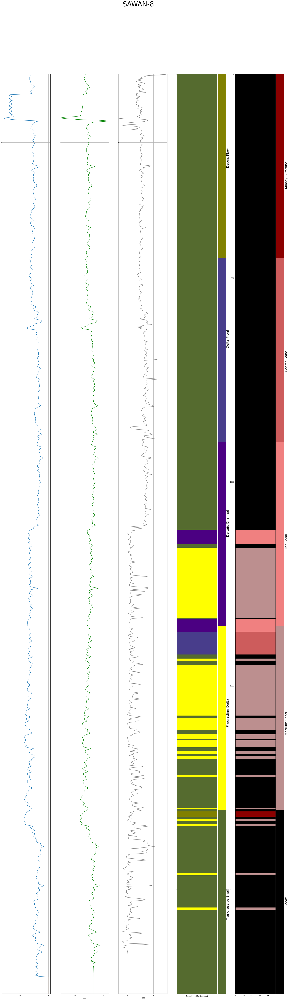

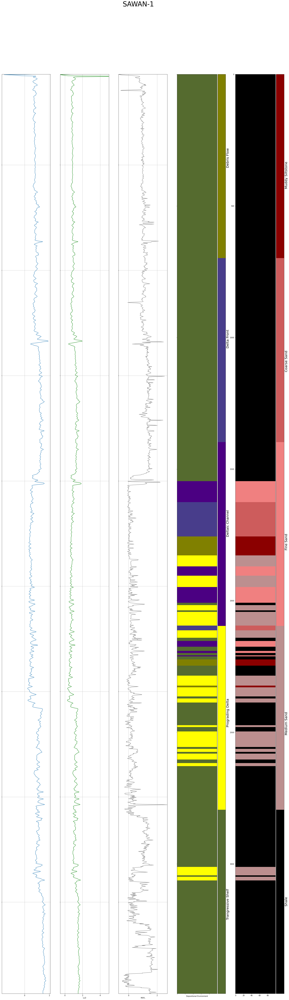

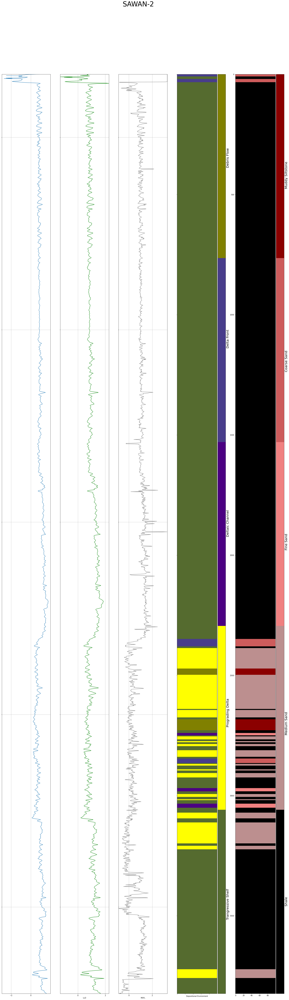

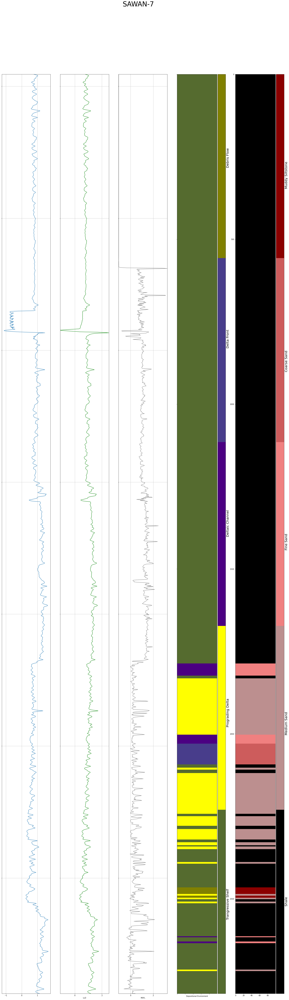

In [185]:
for i,j in zip(data,wells_name):
    make_facies_log_plot(i,DE_color,grain_color,j)

In [42]:
wells_name

['SAWAN-8', 'SAWAN-1', 'SAWAN-2', 'SAWAN-7']

In [43]:
C_sand_intervals={"sawan_well_8":[3267,3362],"sawan_well_1":[3247,3357],"sawan_well_2":[3265,3365],"sawan_well_7":[3270,3365]}
C_sand_intervals=pd.DataFrame(C_sand_intervals)
C_sand_intervals

,sawan_well_8,sawan_well_1,sawan_well_2,sawan_well_7
0,3267,3247,3265,3270
1,3362,3357,3365,3365


In [46]:
C_sand=[]
for i in range(len(data)):
    D = data[i][(data[i]["DEPT"]>C_sand_intervals[C_sand_intervals.columns[i]][0]) & (data[i]["DEPT"]<C_sand_intervals[C_sand_intervals.columns[i]][1])]
    C_sand.append(D)

In [55]:
C_sand[0].to_csv("C:/Users/Farooq Arshad/Desktop/Thesis wells/C_sand data/C_sand sawan well 1.csv")

In [45]:
 C_sand_data = pd.concat([C_sand[0],C_sand[1],C_sand[2],C_sand[3]],axis=0)

In [121]:
(C_sand[0]["Effective Porosity"].mean() + C_sand[1]["Effective Porosity"].mean())/2

13.92363850044254

# Histogram


In [122]:
C_sand[0]=C_sand[0].sort_values(by="Depositional Environment")
C_sand[1]=C_sand[1].sort_values(by="Depositional Environment")
C_sand[2]=C_sand[2].sort_values(by="Depositional Environment")
C_sand[3]=C_sand[3].sort_values(by="Depositional Environment")


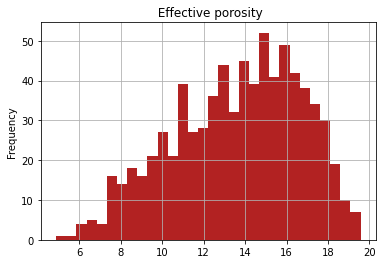

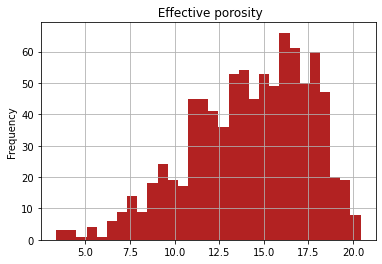

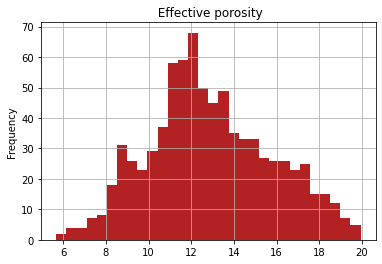

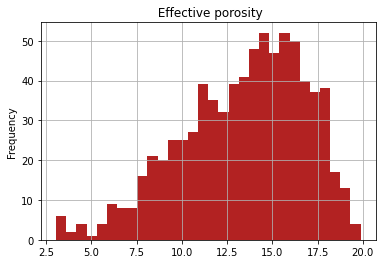

In [123]:
for i in C_sand:
    plt.title(" Effective porosity")
    i["Effective Porosity"].plot.hist(grid=True, bins=30,rwidth=1 , color = "firebrick")
    plt.show()

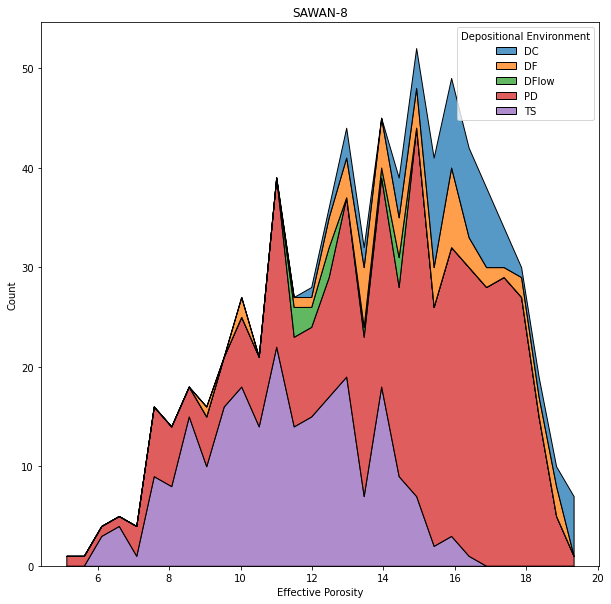

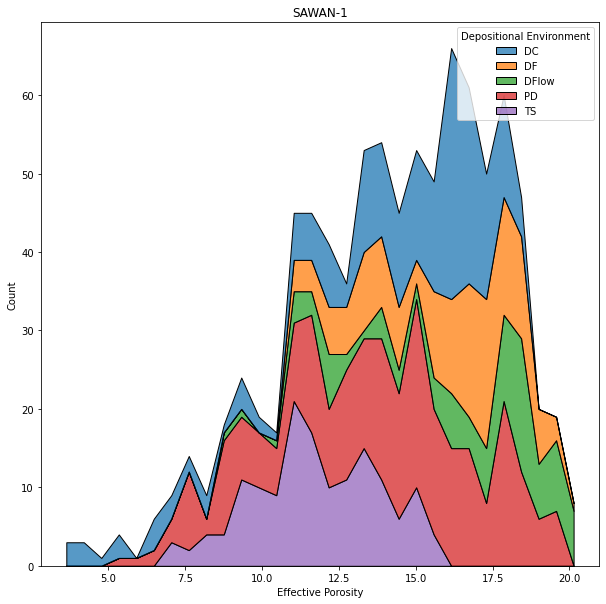

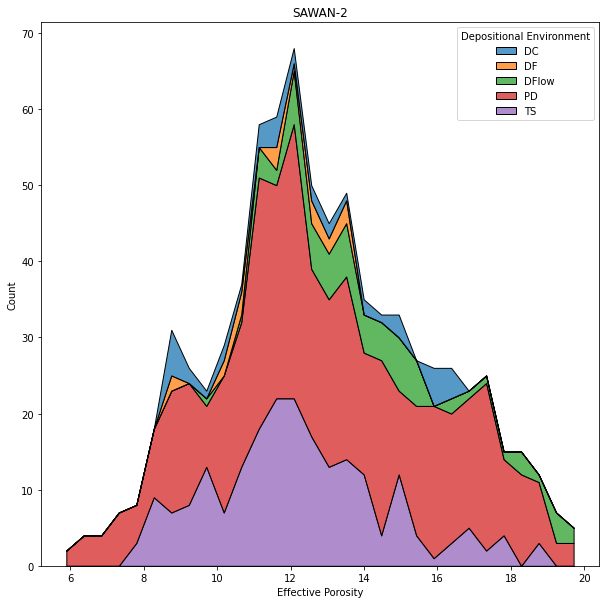

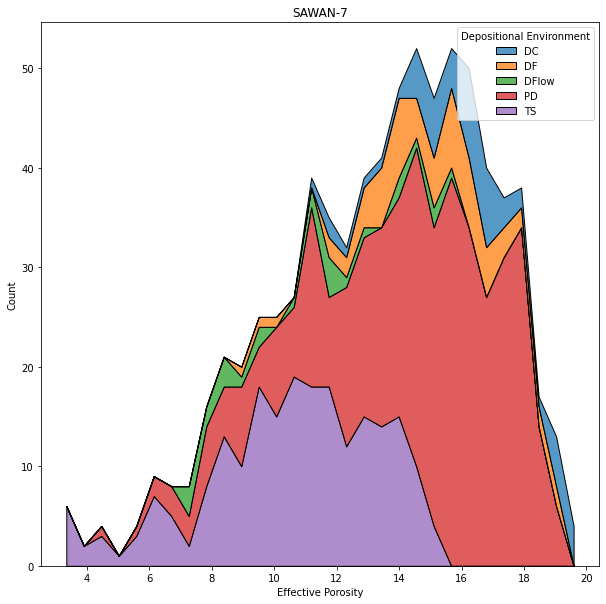

In [124]:
for i in range(len(C_sand)):
    plt.figure(figsize=(10,10))
    plt.title(wells_name[i])
    sns.histplot(data=C_sand[i], x="Effective Porosity", bins=30,hue="Depositional Environment",element="poly",multiple="stack")

In [56]:
labels = ["DC","DF","DFlow","PD","TS"]
wells_n=["SAWAN-08","SAWAN-01","SAWAN-02","SAWAN-07"]
DE_color
pie={"SAWAN-08":[],"SAWAN-01":[],"SAWAN-02":[],"SAWAN-07":[]}
for j,z in zip(C_sand,wells_n):
    for i in labels:
        a = j[j["Depositional Environment"]==i]["Effective Porosity"].mean()
        pie[z].append(a)

In [57]:
pie = pd.DataFrame(pie)
pie

,SAWAN-08,SAWAN-01,SAWAN-02,SAWAN-07
0,16.135408,14.149465,12.482926,16.159362
1,14.805961,15.929883,11.665078,14.937864
2,12.785053,16.508671,14.364562,11.005373
3,14.475575,13.883912,13.067516,14.499527
4,11.170663,11.764216,12.234850,10.511989


In [58]:
C_sand[1]["Effective Porosity"].mean()

14.238815208805004

In [59]:
for i in range(0,len(pie)-1):
    df = pd.DataFrame({"effective average porosity":pie[pie.columns[i]],"labels":labels,"colors":DE_color})
    df = df.sort_values(by="labels")
    fig = px.pie(df,  values="effective average porosity", names="labels", color_discrete_sequence=DE_color)
    fig.show()


In [60]:
colors= ['darkolivegreen', 'yellow', 'indigo', 'darkslateblue',"olive"]

# Well location

In [61]:
data[0] = data[0][data[0]["RHOB"]!= 2.3998]
data[1] = data[1][data[1]["GR"]!=76.2033]
data[1] = data[1][data[1]["GR"]!=173.9846]
data[2] = data[2][data[2]["GR"]!=113.0000]
data[2] = data[2][data[2]["GR"]!=87.1211]
data[3] = data[3][data[3]["GR"]!=89.5152]

In [62]:
phie=[]
for i in data:
    effect = i["Effective Porosity"].mean()
    phie.append(phie)

In [63]:
wells_n = ["SAWAN-01", "SAWAN-07", 'SAWAN-08', 'SAWAN-02']

In [64]:
C_sand[2]["Effective Porosity"].mean()

12.896162220356928

In [65]:
paths

['C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\1-SAWAN-08.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\2-SAWAN-01.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\3-SAWAN-02.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\4-SAWAN-07.las']

In [66]:
y_coordinate = [026.991828 ,026.999283 ,027.009156 ,027.022972 ]
x_coordinate = [068.906992 ,068.923317 ,068.933394 ,068.933806 ]
                  #1           #7         #8           #2
effective_porosity = [C_sand[1]["Effective Porosity"].mean(),C_sand[3]["Effective Porosity"].mean(),C_sand[0]["Effective Porosity"].mean(),C_sand[2]["Effective Porosity"].mean()]

In [67]:
maps = pd.DataFrame({"y_coordinate":y_coordinate,"x_coordinate":x_coordinate},index=wells_n)

In [68]:
maps_analyzed = pd.DataFrame({"y_coordinate":y_coordinate,"x_coordinate":x_coordinate,"Effective Porosity":effective_porosity},index=wells_n)

In [69]:
maps_analyzed

,y_coordinate,x_coordinate,Effective Porosity
SAWAN-01,26.991828,68.906992,14.238815
SAWAN-07,26.999283,68.923317,13.390468
SAWAN-08,27.009156,68.933394,13.608462
SAWAN-02,27.022972,68.933806,12.896162


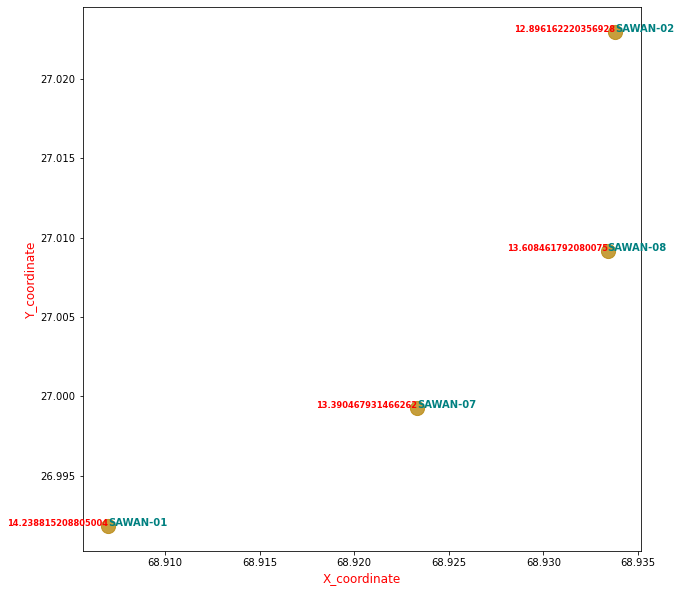

In [70]:
plt.figure(figsize=(10,10))
sns.regplot(data=maps_analyzed, x="x_coordinate", y="y_coordinate", fit_reg=False, color="darkgoldenrod", scatter_kws={'s':200})
plt.xlabel("X_coordinate",color="red",fontsize=12)
plt.ylabel("Y_coordinate",color="red",fontsize=12)
for i in maps_analyzed.index:
     plt.text(maps_analyzed.loc[i][1], maps_analyzed.loc[i][0], i, horizontalalignment='left', size='medium', color='teal', weight='semibold')
for j in range(len(maps_analyzed.index)):
     plt.text(maps_analyzed.iloc[j][1], maps_analyzed.iloc[j][0], maps_analyzed["Effective Porosity"][j], horizontalalignment='right', size='small', color='red', weight='semibold')
plt.show()

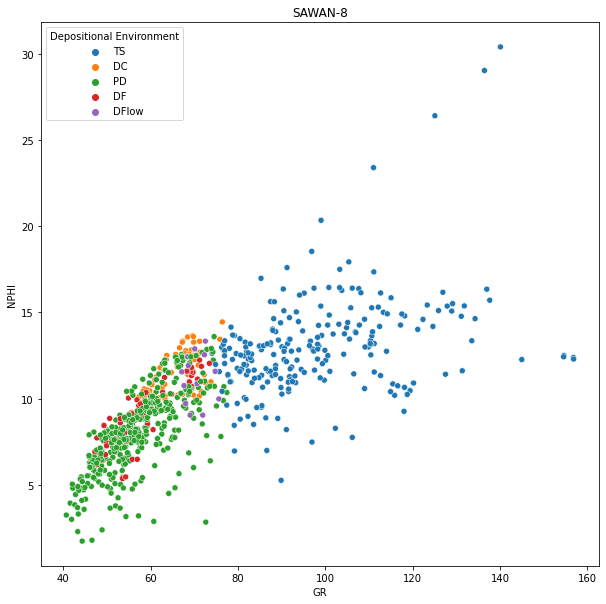

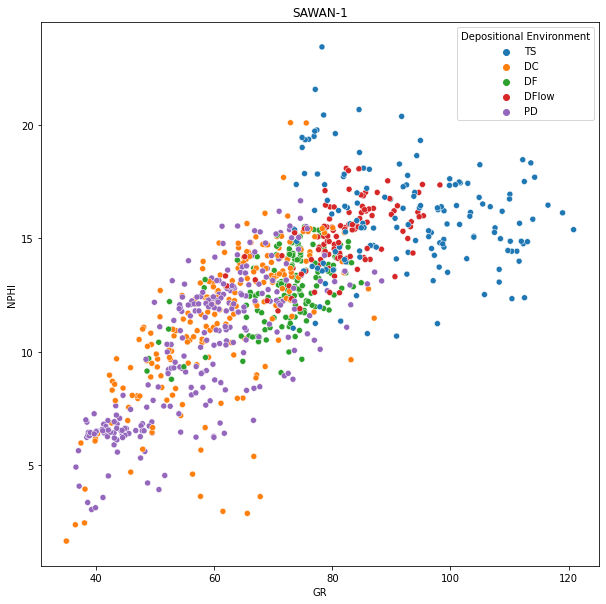

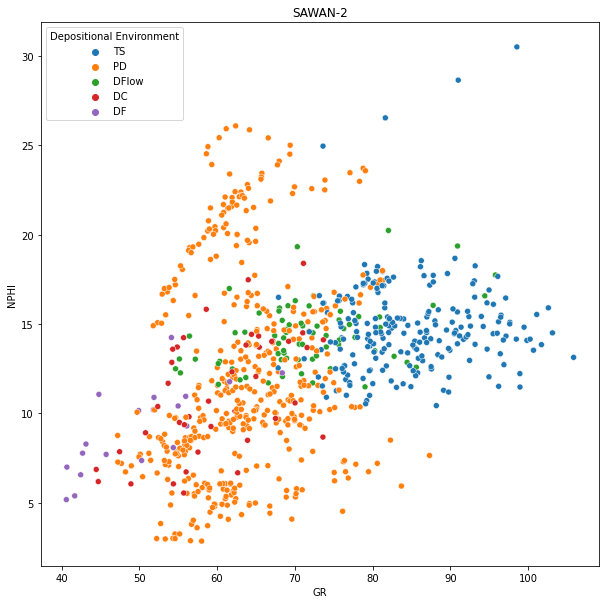

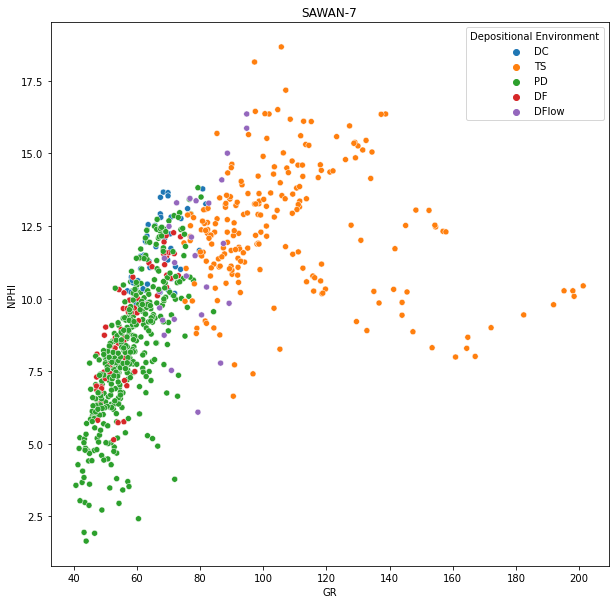

In [71]:
for i,z in zip(C_sand,wells_name):
    plt.figure(figsize=(10,10))
    plt.title(z)
    sns.scatterplot(data=i,x="GR",y="NPHI",hue="Depositional Environment")
    plt.show()

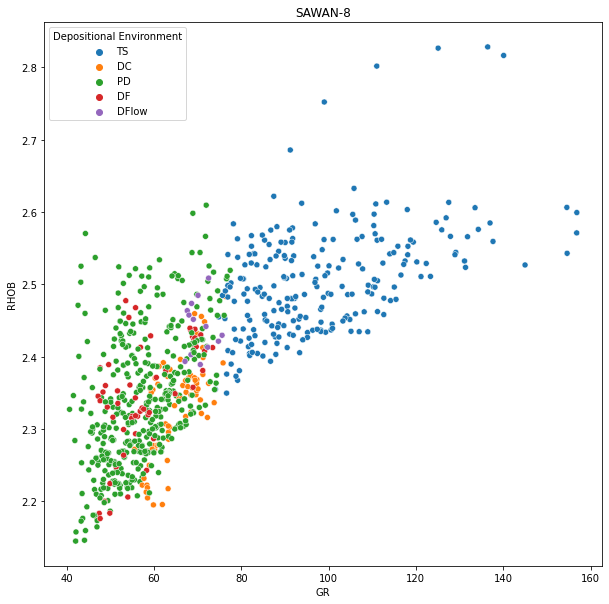

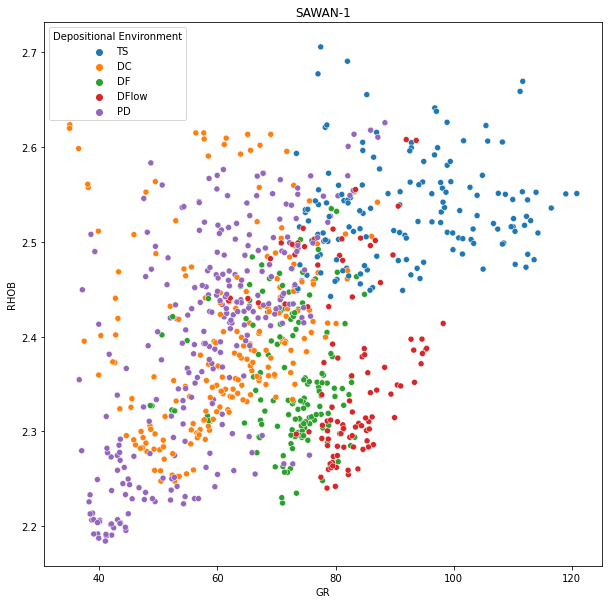

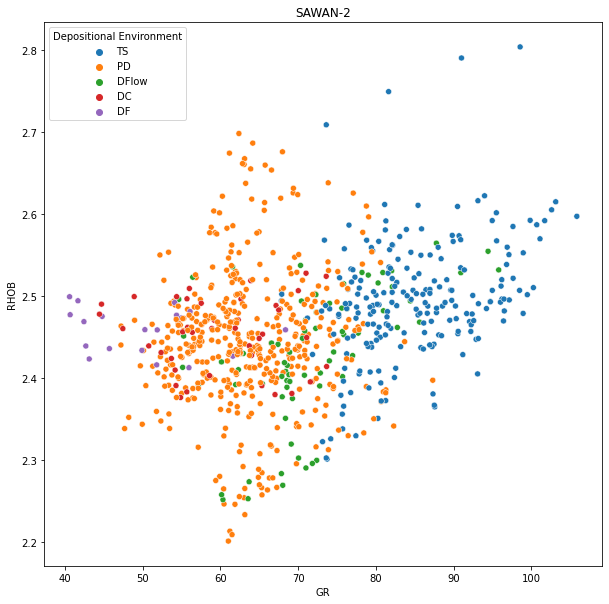

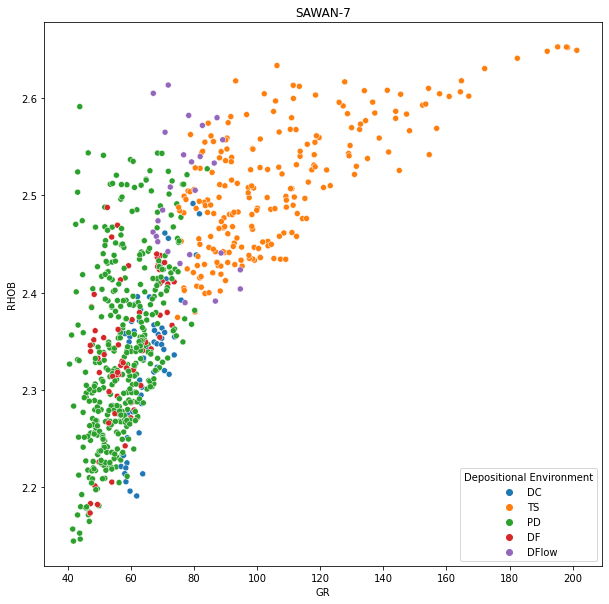

In [72]:
for i,z in zip(C_sand,wells_name):
    plt.figure(figsize=(10,10))
    plt.title(z)
    sns.scatterplot(data=i,x="GR",y="RHOB",hue="Depositional Environment")
    plt.show()

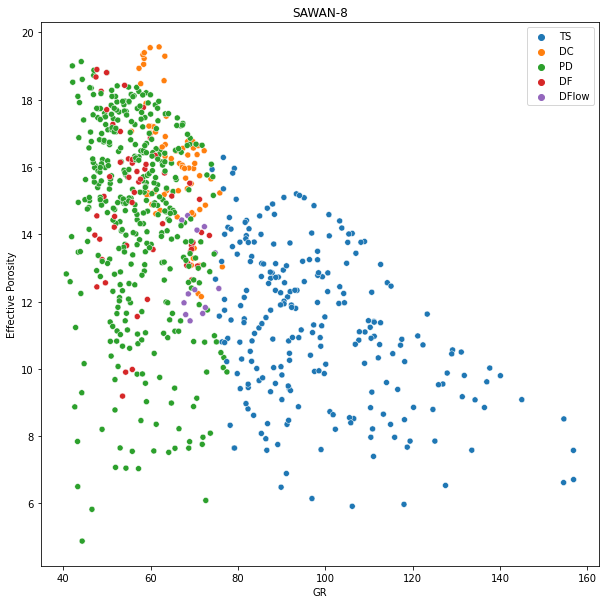

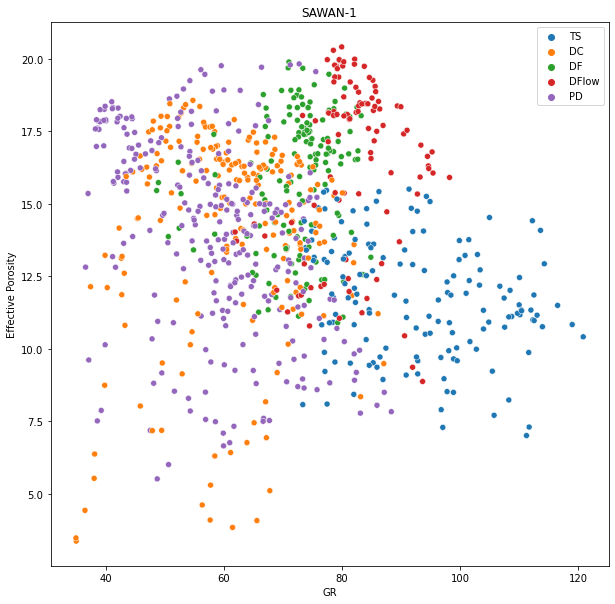

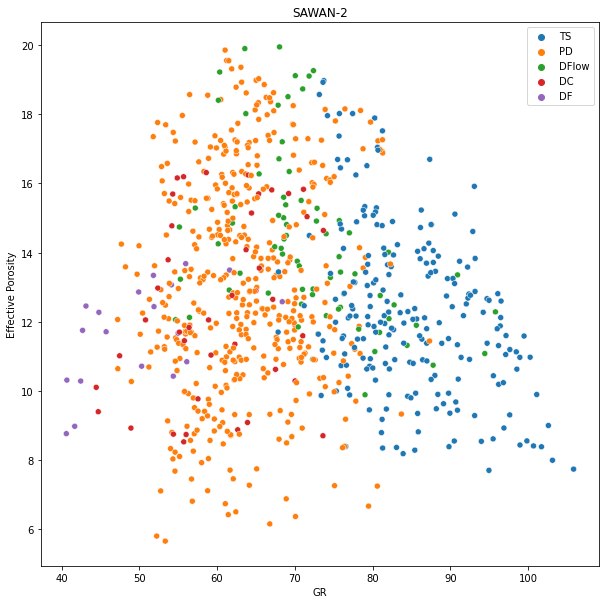

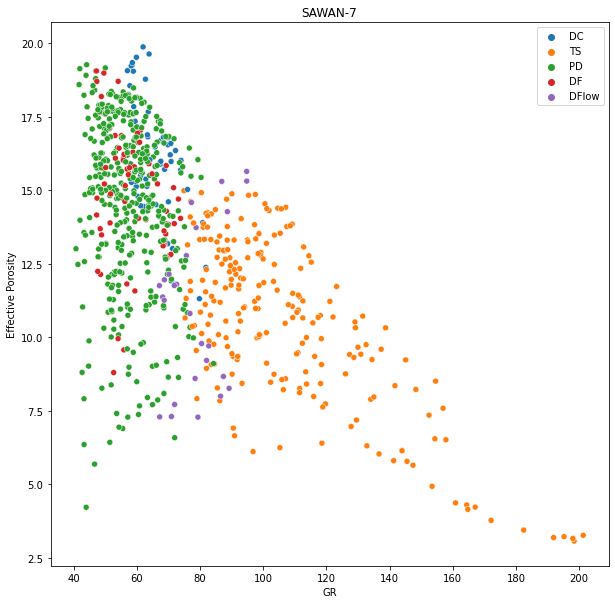

In [73]:
for i,z in zip(C_sand,wells_name):
    plt.figure(figsize=(10,10))
    plt.title(z)
    sns.scatterplot(data=i,x="GR",y="Effective Porosity",hue="Depositional Environment")
    plt.legend()
    plt.show()

# MACHINE LEARNING MODEL

In [74]:
model_data = data.copy()

##### Data preparation

In [75]:
model_data[0]=model_data[0][round(model_data[0]["MSFL"],3)!=0.009]
model_data[0]=model_data[0][round(model_data[0]["RHOB"],3)!=2.400]


In [76]:
model_data[3]=model_data[3][model_data[3]["RHOB"]!=2.3998]
model_data[3]=model_data[3][model_data[3]["RHOB"]!=2.2798]
model_data[3]=model_data[3][model_data[3]["GR"]!=89.5152]

In [77]:
model_data[2]=model_data[2][model_data[2]["GR"]!=113.0000]
model_data[2]=model_data[2][model_data[2]["GR"]!=87.1211]

In [78]:
data_1=pd.concat([model_data[0],model_data[1],model_data[2]])

In [79]:
data_1

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,LLS_o,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment,Depositional Environment Label,Grain Size,Grain Size Label
136,3129.0707,8.7012,108.7760,12.7700,0.0203,0.779842,0.784995,35.75,2.4015,79.1427,...,6.0953,18.040936,26.895468,22.307110,1.573812,25.321656,TS,1,Shale,1
137,3129.1957,8.7008,106.3331,12.7700,0.0203,0.760053,0.766249,35.85,2.4079,79.1427,...,5.8378,17.666667,26.758333,21.507027,1.517365,25.240969,TS,1,Shale,1
138,3129.3207,8.7002,107.4185,12.7700,0.0203,0.739485,0.746634,36.25,2.4081,79.1427,...,5.5800,17.654971,26.952485,21.862510,1.542445,25.410041,TS,1,Shale,1
139,3129.4457,8.7006,109.3629,12.7700,0.0203,0.719497,0.726906,37.87,2.3828,79.1427,...,5.3322,19.134503,28.502251,22.499328,1.587374,26.914878,TS,1,Shale,1
140,3129.5707,8.7008,112.2359,12.7700,0.0203,0.705830,0.714028,40.16,2.3469,79.1427,...,5.1764,21.233918,30.696959,23.440274,1.653759,29.043200,TS,1,Shale,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3907,3444.5295,9.0497,121.9929,10.5779,0.0255,1.565974,1.463086,12.78,2.4322,83.2169,...,29.0460,16.245614,14.512807,32.214986,2.669096,11.843711,TS,1,Shale,1
3908,3444.6545,8.8465,118.9244,10.7557,0.0260,1.605863,1.504589,13.02,2.5249,84.6494,...,31.9587,10.824561,11.922281,31.000329,2.568459,9.353822,TS,1,Shale,1
3909,3444.7795,9.1856,108.8879,10.5365,0.0255,1.631854,1.536345,12.48,2.6045,82.9131,...,34.3831,6.169591,9.324795,27.027410,2.239292,7.085503,TS,1,Shale,1
3910,3444.9045,9.3723,100.6980,10.2945,0.0247,1.644773,1.562236,12.00,2.6446,80.7699,...,36.4952,3.824561,7.912281,23.785462,1.970688,5.941593,TS,1,Shale,1


In [80]:
data_1 = data_1.replace([np.inf, -np.inf], np.nan)
data_1 = data_1.dropna(how="any").reset_index(drop=True)

In [81]:
data_1.isnull().sum()

DEPT                              0
CALI                              0
GR                                0
THOR                              0
POTA                              0
LLD                               0
LLS                               0
NPHI                              0
RHOB                              0
CGR                               0
SGR                               0
BS                                0
URAN                              0
MSFL                              0
PEF                               0
SP                                0
LLS_o                             0
Density Porosity                  0
Average Porosity                  0
Clay Volume                       0
Clay Effect                       0
Effective Porosity                0
Depositional Environment          0
Depositional Environment Label    0
Grain Size                        0
Grain Size Label                  0
dtype: int64

In [82]:
X = data_1[["GR","RHOB","LLS","PEF","MSFL"]]


In [83]:
Y = data_1[["NPHI"]]
Y.isnull().sum()

NPHI    0
dtype: int64

In [84]:
from sklearn.model_selection import train_test_split

In [85]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,train_size=0.9)

In [86]:
Y_train

,NPHI
5116,21.12
7985,18.57
7067,19.87
2054,5.22
7202,23.36
...,...
9090,11.45
6149,13.55
6805,23.45
1350,10.84


In [87]:
from sklearn import tree
from sklearn.metrics import r2_score

In [88]:
clf = tree.DecisionTreeRegressor()


In [89]:
clf.fit(X_train,Y_train)

DecisionTreeRegressor()

In [90]:
pred=clf.predict(X_test)

In [91]:
r2_score(Y_test,pred)

0.7857298845651803

In [92]:
Y_test

,NPHI
8375,13.92
9299,21.68
3472,14.82
4652,6.63
7810,15.84
...,...
4308,10.69
5699,23.78
8977,10.31
8923,10.88


In [93]:
pd.DataFrame(pred)

,0
0,14.70
1,18.54
2,16.99
3,7.26
4,15.12
...,...
943,20.20
944,24.20
945,8.97
946,11.83


In [94]:
X_unseen = model_data[3][["GR","RHOB","LLS","PEF","MSFL"]]

In [95]:
X_unseen

,GR,RHOB,LLS,PEF,MSFL
670,106.3526,2.4095,0.766450,28.7529,3.065879
671,107.4144,2.4082,0.746751,26.5850,3.085415
672,109.2486,2.3836,0.726849,25.4847,1.301078
673,113.6889,2.3414,0.711588,26.3121,1.250571
674,110.3447,2.3299,0.709397,27.1012,1.503897
...,...,...,...,...,...
2783,81.2282,2.4755,0.908330,5.1591,0.169733
2784,80.8952,2.4787,0.944404,5.4239,0.185882
2785,82.8030,2.4832,0.998756,5.8518,0.160948
2786,86.5479,2.4947,1.061780,6.0218,0.111632


In [96]:
Y_unseen = model_data[3]["NPHI"]

In [97]:
prediction = clf.predict(X_unseen)

In [98]:
r2_score(prediction,Y_unseen)

0.9283978530241852

In [99]:
prediction

array([36.25, 36.25, 37.87, ...,  5.81,  3.77,  2.98])

In [100]:
Y_unseen.values

array([35.69, 36.8 , 39.17, ...,  4.22,  3.39,  2.65])

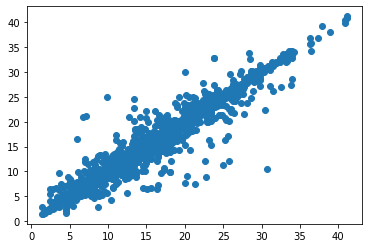

In [101]:
plt.scatter(prediction,Y_unseen.values)

In [102]:
wells[1].columns

Index(['DEPT', 'C1', 'C2', 'CALI', 'CALS', 'CGR', 'DRHO', 'DT', 'DTL', 'DTLF',
       'DTLN', 'GR', 'LLD', 'LLS', 'MSFL', 'NPHI', 'PEF', 'POTA', 'RHOB',
       'SGR', 'SP', 'THOR', 'URAN', 'BS'],
      dtype='object')

In [103]:
paths

['C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\1-SAWAN-08.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\2-SAWAN-01.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\3-SAWAN-02.las',
 'C:/Users/Farooq Arshad/Desktop/Thesis wells/SAWAN_BS/sawan_wells/New_DATA\\4-SAWAN-07.las']

In [104]:
wells_name

['SAWAN-8', 'SAWAN-1', 'SAWAN-2', 'SAWAN-7']

In [105]:
for i in data:
    i["Diff"] = i["BS"]-i["CALI"]

<ipython-input-105-323343a80e40>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



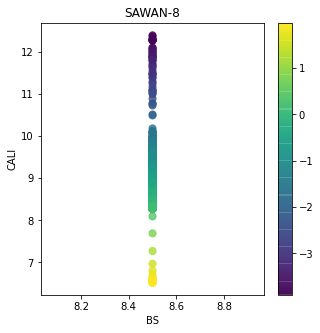

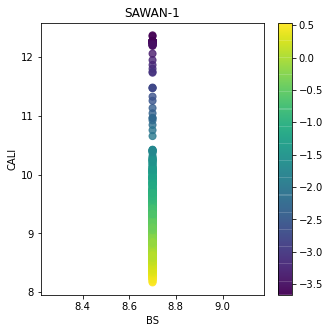

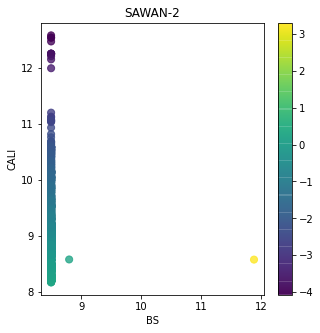

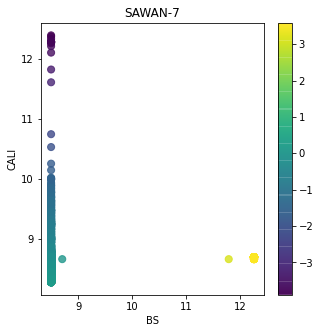

In [106]:


for i,j in zip(data,wells_name):
    fig = plt.figure(figsize=(5,5))
    third = i["Diff"]
    plt.scatter(i["BS"], i["CALI"], s = 50, c = third, alpha = 0.8)
    plt.xlabel("BS")
    plt.ylabel("CALI")
    plt.title(j)
    plt.colorbar()
    plt.show()



In [107]:
calip=data.copy()

In [108]:
for i in range(len(calip)):
    calip[i] = calip[i][calip[i]["Diff"]>=-0.3]

In [109]:
calip[3]

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment,Depositional Environment Label,Grain Size,Grain Size Label,Diff
0,3045.4094,8.7006,135.9561,12.7700,0.0203,0.748901,0.747210,35.51,2.3998,79.1427,...,18.140351,26.825175,31.005156,2.211112,24.614064,TS,1,Shale,1,3.5494
1,3045.5344,8.7006,131.0187,12.7700,0.0203,0.831793,0.826845,35.51,2.3998,79.1427,...,18.140351,26.825175,29.398949,2.096566,24.728609,TS,1,Shale,1,3.5494
2,3045.6594,8.7006,125.6305,12.7700,0.0203,0.912025,0.904326,35.51,2.3998,79.1427,...,18.140351,26.825175,27.646091,1.971562,24.853613,TS,1,Shale,1,3.5494
3,3045.7844,8.7006,121.9168,12.7700,0.0203,0.975464,0.965268,35.51,2.3998,79.1427,...,18.140351,26.825175,26.437971,1.885406,24.939769,TS,1,Shale,1,3.5494
4,3045.9094,8.7006,118.5777,12.7700,0.0203,1.018846,1.007223,35.51,2.3998,79.1427,...,18.140351,26.825175,25.351714,1.807940,25.017235,TS,1,Shale,1,3.5494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2738,3387.6552,8.5416,133.2056,8.0994,0.0476,1.328204,1.253142,9.65,2.5702,104.8520,...,8.175439,8.912719,30.110379,2.147301,6.765418,TS,1,Shale,1,-0.0416
2739,3387.7802,8.4523,138.6800,8.0798,0.0475,1.320522,1.237438,9.44,2.5895,104.6003,...,7.046784,8.243392,31.891280,2.274305,5.969087,TS,1,Shale,1,0.0477
2740,3387.9052,8.6078,136.6503,7.8606,0.0418,1.299381,1.209670,9.30,2.5768,94.8866,...,7.789474,8.544737,31.230989,2.227217,6.317520,TS,1,Shale,1,-0.1078
2774,3392.1552,8.7700,82.8341,12.0934,0.0372,1.525387,1.399454,5.81,2.1686,103.3080,...,31.660819,18.735409,13.723808,0.978704,17.756705,TS,1,Shale,1,-0.2700


In [110]:
calip[0]=calip[0][round(calip[0]["MSFL"],3)!=0.009]
calip[0]=calip[0][round(calip[0]["RHOB"],3)!=2.400]
calip[3]=calip[3][calip[3]["RHOB"]!=2.3998]
calip[3]=calip[3][calip[3]["RHOB"]!=2.2798]
calip[3]=calip[3][calip[3]["GR"]!=89.5152]
calip[2]=calip[2][calip[2]["GR"]!=113.0000]
calip[2]=calip[2][calip[2]["GR"]!=87.1211]


In [111]:
data_2=pd.concat([calip[0],calip[1],calip[2]])

In [112]:
data_2 = data_2.replace([np.inf, -np.inf], np.nan)
data_2 = data_2.dropna(how="any").reset_index(drop=True)

In [113]:
X = data_2[["GR","RHOB","LLD","PEF","MSFL"]]

In [114]:
X.isnull().sum()

GR      0
RHOB    0
LLD     0
PEF     0
MSFL    0
dtype: int64

In [115]:
Y = data_2[["NPHI"]]

In [116]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,train_size=0.9)

In [117]:
from sklearn import tree
from sklearn.metrics import r2_score
clf = tree.DecisionTreeRegressor()
clf.fit(X_train,Y_train)
pred=clf.predict(X_test)
r2_score(Y_test,pred)

0.7683456725298661

In [118]:
X_unseen = calip[3][["GR","RHOB","LLD","PEF","MSFL"]]

In [119]:
Y_unseen = calip[3]["NPHI"]

In [120]:
prediction = clf.predict(X_unseen)
r2_score(prediction,Y_unseen)

0.9131848907151703

E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



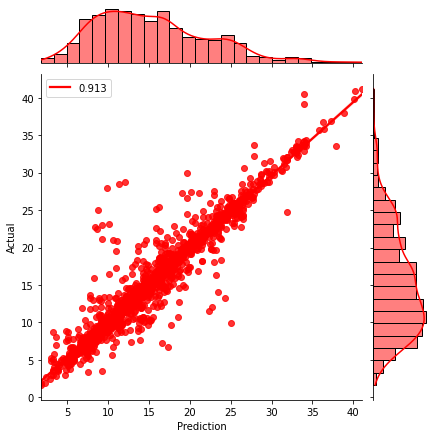

In [121]:
plt.figure
sns.jointplot(prediction,Y_unseen.values, kind="reg",color = "red")
plt.xlabel("Prediction")
plt.ylabel("Actual")
plt.legend([round(r2_score(prediction,Y_unseen),3)])

In [111]:
prediction

array([35.85, 36.25, 33.33, ..., 18.42, 11.4 ,  5.88])

In [243]:
Y_unseen

670     35.69
671     36.80
672     39.17
673     40.89
674     41.21
        ...  
2738     9.65
2739     9.44
2740     9.30
2774     5.81
2775     5.73
Name: NPHI, Length: 1824, dtype: float64

# Formation Temperature

In [65]:
Bottom_hole  = 300
Top_hole = 80
Total_depth = 3437.5

In [66]:
gradient=(Bottom_hole-Top_hole)/Total_depth
gradient

0.064

In [67]:
data[0]["Formation Temperature Depth"]=(gradient*data[0]["DEPT"])+Top_hole

In [73]:
saturation_data = data[0][(data[0]["DEPT"]>3267) & (data[0]["DEPT"]<3362)]

In [75]:
formation_temperature = saturation_data["Formation Temperature Depth"].mean()

In [76]:
formation_temperature

292.1285248

# Estimation of water resistivity

In [50]:
RMF_BHT = float(input("Enter the resistivity of mud filtrate at the bottom hole temperature : "))

Enter the resistivity of mud filtrate at the bottom hole temperature : 0.029


In [45]:
BHT = float(input("Enter the maximum recorded temperature : "))

Enter the maximum recorded temperature : 300


In [46]:
salinity = float(input("Enter the salinity from S-T chart in K: "))

Enter the salinity from S-T chart in K: 280


In [48]:
rmf_75 = float(input("Enter the resistivity of mud filtrate of water at 75: "))

Enter the resistivity of mud filtrate of water at 75: 0.041


# Facies Classification

In [137]:
facies_data = data.copy()

In [138]:
facies_data_model = pd.concat([facies_data[0],facies_data[1],facies_data[2]])

In [197]:
facies_unseen = facies_data[3]

In [286]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score

In [287]:
X = facies_data_model[["GR","LLD","NPHI","RHOB"]]

In [288]:
Y = facies_data_model["Depositional Environment Label"]

In [289]:
Y

136     1
137     1
138     1
139     1
140     1
       ..
3907    1
3908    1
3909    1
3910    1
3911    1
Name: Depositional Environment Label, Length: 9573, dtype: int64

In [290]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,train_size=0.9,shuffle=False)

In [291]:
X_test

,GR,LLD,NPHI,RHOB
2954,81.7680,0.608301,12.66,2.5562
2955,81.2838,0.719489,12.42,2.5912
2956,76.5410,0.864422,11.90,2.5861
2957,69.5545,0.964566,11.01,2.5470
2958,62.9291,0.978135,9.84,2.4991
...,...,...,...,...
3907,121.9929,1.565974,12.78,2.4322
3908,118.9244,1.605863,13.02,2.5249
3909,108.8879,1.631854,12.48,2.6045
3910,100.6980,1.644773,12.00,2.6446


In [292]:
clf =tree.DecisionTreeClassifier()
# clf = KNeighborsClassifier(n_neighbors=6)

In [293]:
clf.fit(X_train,Y_train)

DecisionTreeClassifier()

In [294]:
predictions = clf.predict(X_test)

In [295]:
accuracy_score(Y_test,predictions)

0.8716075156576201

In [296]:
facies_unseen_X = facies_unseen[["GR","LLD","NPHI","RHOB"]]

In [297]:
facies_unseen_Y = facies_unseen["Depositional Environment Label"]

In [298]:
predictions_new = clf.predict(facies_unseen_X)

In [299]:
predictions_new = pd.DataFrame(predictions_new,columns=["Depositional Environment Label"])

In [300]:
accuracy_score(facies_unseen_Y,predictions_new)

0.9548063127690101

In [301]:
facies_unseen_Y

0       1
1       1
2       1
3       1
4       1
       ..
2783    1
2784    1
2785    1
2786    1
2787    1
Name: Depositional Environment Label, Length: 2788, dtype: int64

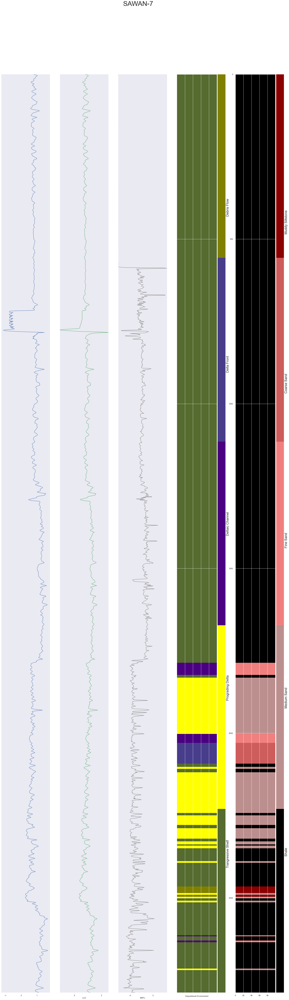

In [302]:
make_facies_log_plot(facies_unseen,DE_color,grain_color,"SAWAN-7")

In [303]:
facies_unseen

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment,Depositional Environment Label,Grain Size,Grain Size Label,Diff
0,3045.4094,8.7006,135.9561,12.7700,0.0203,0.748901,0.747210,35.51,2.3998,79.1427,...,18.140351,26.825175,31.005156,2.211112,24.614064,TS,1,Shale,1,3.5494
1,3045.5344,8.7006,131.0187,12.7700,0.0203,0.831793,0.826845,35.51,2.3998,79.1427,...,18.140351,26.825175,29.398949,2.096566,24.728609,TS,1,Shale,1,3.5494
2,3045.6594,8.7006,125.6305,12.7700,0.0203,0.912025,0.904326,35.51,2.3998,79.1427,...,18.140351,26.825175,27.646091,1.971562,24.853613,TS,1,Shale,1,3.5494
3,3045.7844,8.7006,121.9168,12.7700,0.0203,0.975464,0.965268,35.51,2.3998,79.1427,...,18.140351,26.825175,26.437971,1.885406,24.939769,TS,1,Shale,1,3.5494
4,3045.9094,8.7006,118.5777,12.7700,0.0203,1.018846,1.007223,35.51,2.3998,79.1427,...,18.140351,26.825175,25.351714,1.807940,25.017235,TS,1,Shale,1,3.5494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2783,3393.2801,8.8671,81.2282,7.5129,0.0329,0.965018,0.908330,5.39,2.4755,79.6263,...,13.713450,9.551725,13.201386,0.941448,8.610277,TS,1,Shale,1,-0.3671
2784,3393.4051,8.8507,80.8952,7.1430,0.0311,0.999752,0.944404,5.01,2.4787,75.3546,...,13.526316,9.268158,13.093056,0.933722,8.334435,TS,1,Shale,1,-0.3507
2785,3393.5301,9.0025,82.8030,7.1699,0.0310,1.053900,0.998756,4.22,2.4832,75.3501,...,13.263158,8.741579,13.713691,0.977983,7.763596,TS,1,Shale,1,-0.5025
2786,3393.6551,9.2302,86.5479,7.0285,0.0295,1.117729,1.061780,3.39,2.4947,72.4216,...,12.590643,7.990322,14.931961,1.064863,6.925459,TS,1,Shale,1,-0.7302


In [304]:
facies_predicted = facies_unseen.drop(columns="Depositional Environment Label")

In [305]:
facies_predicted = pd.concat([facies_predicted,predictions_new],axis=1)

In [306]:
facies_predicted

,DEPT,CALI,GR,THOR,POTA,LLD,LLS,NPHI,RHOB,CGR,...,Density Porosity,Average Porosity,Clay Volume,Clay Effect,Effective Porosity,Depositional Environment,Grain Size,Grain Size Label,Diff,Depositional Environment Label
0,3045.4094,8.7006,135.9561,12.7700,0.0203,0.748901,0.747210,35.51,2.3998,79.1427,...,18.140351,26.825175,31.005156,2.211112,24.614064,TS,Shale,1,3.5494,1
1,3045.5344,8.7006,131.0187,12.7700,0.0203,0.831793,0.826845,35.51,2.3998,79.1427,...,18.140351,26.825175,29.398949,2.096566,24.728609,TS,Shale,1,3.5494,1
2,3045.6594,8.7006,125.6305,12.7700,0.0203,0.912025,0.904326,35.51,2.3998,79.1427,...,18.140351,26.825175,27.646091,1.971562,24.853613,TS,Shale,1,3.5494,1
3,3045.7844,8.7006,121.9168,12.7700,0.0203,0.975464,0.965268,35.51,2.3998,79.1427,...,18.140351,26.825175,26.437971,1.885406,24.939769,TS,Shale,1,3.5494,1
4,3045.9094,8.7006,118.5777,12.7700,0.0203,1.018846,1.007223,35.51,2.3998,79.1427,...,18.140351,26.825175,25.351714,1.807940,25.017235,TS,Shale,1,3.5494,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2783,3393.2801,8.8671,81.2282,7.5129,0.0329,0.965018,0.908330,5.39,2.4755,79.6263,...,13.713450,9.551725,13.201386,0.941448,8.610277,TS,Shale,1,-0.3671,1
2784,3393.4051,8.8507,80.8952,7.1430,0.0311,0.999752,0.944404,5.01,2.4787,75.3546,...,13.526316,9.268158,13.093056,0.933722,8.334435,TS,Shale,1,-0.3507,1
2785,3393.5301,9.0025,82.8030,7.1699,0.0310,1.053900,0.998756,4.22,2.4832,75.3501,...,13.263158,8.741579,13.713691,0.977983,7.763596,TS,Shale,1,-0.5025,1
2786,3393.6551,9.2302,86.5479,7.0285,0.0295,1.117729,1.061780,3.39,2.4947,72.4216,...,12.590643,7.990322,14.931961,1.064863,6.925459,TS,Shale,1,-0.7302,1


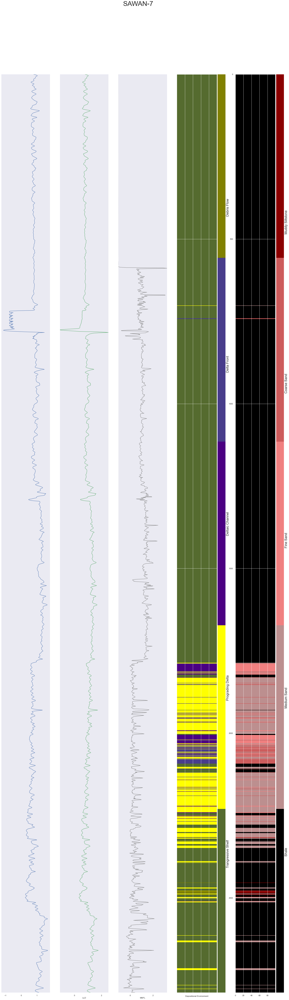

In [307]:
make_facies_log_plot(facies_predicted,DE_color,grain_color,"SAWAN-7")

In [285]:
np.array([2,2,3,4]).cumprod()

array([ 2,  4, 12, 48], dtype=int32)